In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
%config InlineBackend.figure_format='retina'

## Camera Calibration

Extract the object points and the corresponding image points to use in the camera calibration

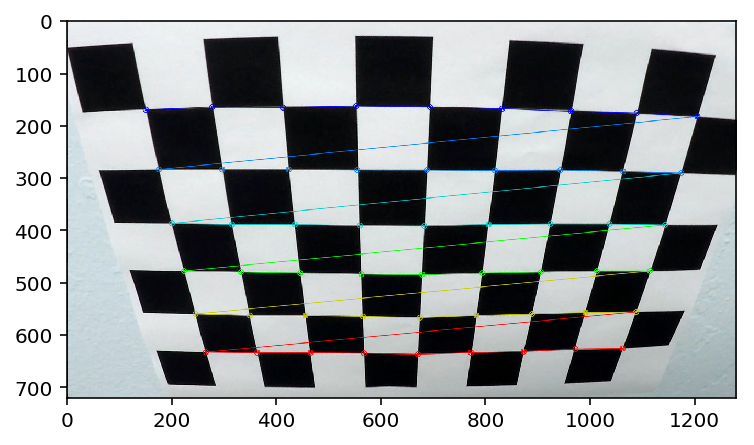

In [2]:
nx = 9 # number of inside corners in a given row
ny = 6 # number of inside corners in a given column

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    '''
    Find the chessboard corners
    '''
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        '''
        Draw and display the corners on the chessboard
        '''
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #plt.figure()
        plt.imshow(img)        
        

### Camera calibration matrix and testing on one of the calibration images
Using the object points and the image points, calculate the camera matrix

Test it on one of the camera calibration images, to make sure that undistorted image, after applying the camera matric transformation, looks ok.

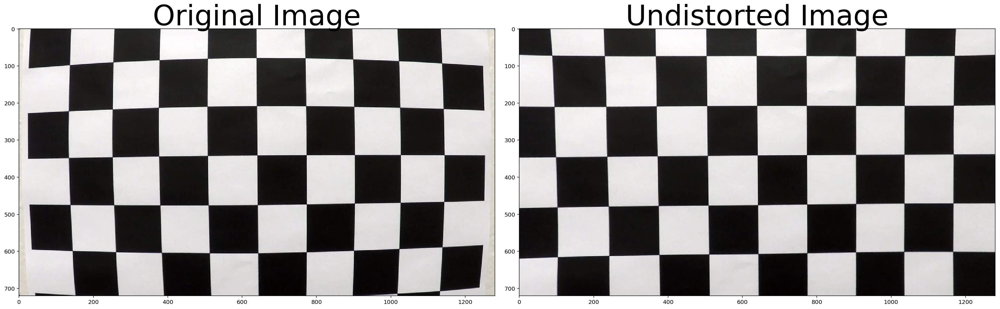

In [3]:
img = cv2.imread('camera_cal/calibration1.jpg')

# Convert to grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

#Camera calibration, given object points, image points, and the shape of the grayscale image
# returns the camera matrix
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# store away the camera calibration matrix
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_calibration.p", "wb" ))

#Undistorting using camera matrix,
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.cvtColor(undistorted,cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Distortion correction on a test image

In [4]:
img = cv2.imread('test_images/test1.jpg')

# Read in the saved camera matrix and distortion coefficients
dist_pickle = pickle.load( open( "camera_calibration.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

#Undistorting using camera matrix,
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.cvtColor(undistorted,cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


---
## Gradient Thresholding

### Sobel X or Y Gradient

In [5]:
'''
Define a function that applies Sobel x or y, 
then takes an absolute value and applies a threshold.
'''
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20, 100)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    # Take the absolute value of the derivative or gradient
    if orient == 'x':
        abs_sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        abs_sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    else:
        print("Orient value of", orient, " is not supported!")
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8((255*abs_sobel)/np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    abs_sobel_binary = np.zeros_like(scaled_sobel)
    abs_sobel_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return abs_sobel_binary

### Gradient magnitude

In [6]:
'''
Define a function that applies Sobel x and y, 
then computes the magnitude of the gradient
and applies a threshold
'''
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude 
    grad_mag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_grad_mag = np.uint8((255*grad_mag)/np.max(grad_mag))
    
    # Create a binary mask where mag thresholds are met
    grad_mag_binary = np.zeros_like(scaled_grad_mag)
    grad_mag_binary[(scaled_grad_mag >= mag_thresh[0]) & (scaled_grad_mag <= mag_thresh[1])] = 1
    
    # Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return grad_mag_binary


### Gradient direction

In [7]:
'''
Define a function that applies Sobel x and y, 
then computes the direction of the gradient
and applies a threshold.
'''
def dir_threshold(img, sobel_kernel=3, thresh=(0.6, 1.4)):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # Create a binary mask where direction thresholds are met
    # Return this mask as your binary_output image
    grad_dir_binary = np.zeros_like(grad_dir)
    grad_dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    
    return grad_dir_binary

### Set a combined threshold using Sobel X or Y gradient, gradient magnitude and gradient direction

The combination threshold are faint and at this point I am leaning towards not using the gradient-based threshold

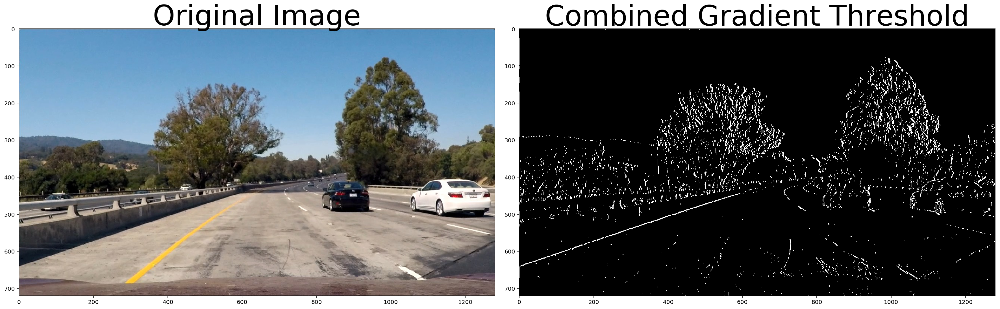

In [8]:
# Read in an image and grayscale it
image = cv2.imread('test_images/test1.jpg')

# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
grad_x_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grad_y_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
grad_mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
grad_dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

combined = np.zeros_like(grad_dir_binary)
#combined[((grad_x_binary == 1) & (grad_y_binary == 1)) | ((grad_mag_binary == 1) & (grad_dir_binary == 1))] = 1
#combined[((grad_x_binary == 1) | (grad_y_binary ==1)) & (grad_dir_binary == 1)] = 1
combined[(grad_x_binary == 1)] = 1
'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap = 'gray')
ax2.set_title('Combined Gradient Threshold', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Exploring the HLS color space

s_binary thresholds of (140,255) seem to work well across the various test images

l_binary is pretty good in areas that have shadows of trees and other objects, but produces a lot of noise in other areas. I don't think this can be used unless some kind of selective filter is applied

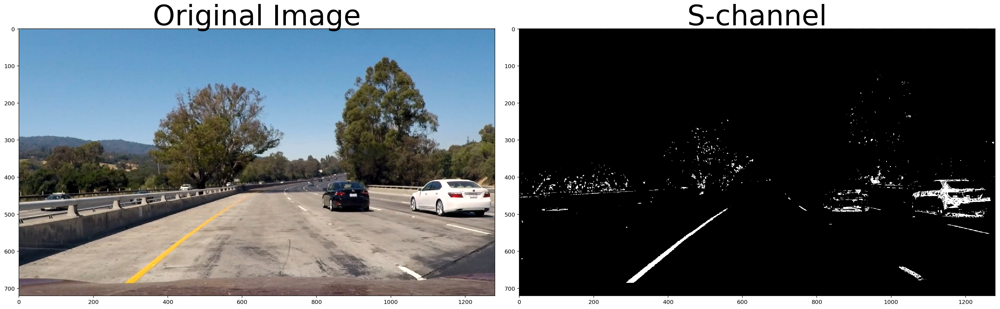

In [9]:
'''
Define a function that uses a combination of h,l,s color space
return the best binary to use
'''
def hls_threshold(image, thresh_l=(140,255), thres_s=(200,255)):
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    s_binary = np.zeros_like(S)
    s_binary[(S > thres_s[0]) & (S <= thres_s[1])] = 1

    l_binary = np.zeros_like(L)
    l_binary[(L > thresh_l[0]) & (L <= thresh_l[1])] = 1

    return l_binary, s_binary

# Read in an image and grayscale it
image = cv2.imread('test_images/test1.jpg')

l_binary, s_binary = hls_threshold(image)

'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap = 'gray')
ax2.set_title('S-channel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

---
## Combining Color and Gradient Thresholds

### Exploring the RGB color space

Player around with various thresholds in the RG space (B is not very effective at detection lane edges) and ended up with a combined R-G threshold that work reasonably well

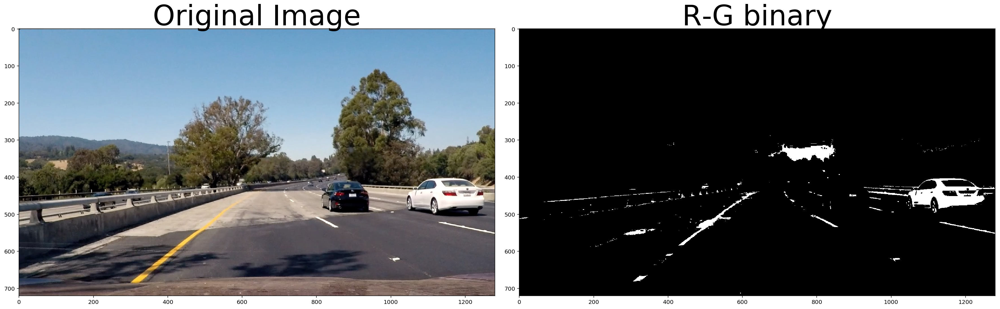

In [10]:
'''
Define a function that uses RGB
return a combo binary
'''
def rgb_threshold(image, thresh_r = (200, 255),thresh_g = (200, 255)):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    R = rgb[:,:,0]
    G = rgb[:,:,1]
    B = rgb[:,:,2]

    r_binary = np.zeros_like(R)
    r_binary[(R > thresh_r[0]) & (R <= thresh_r[1])] = 1

    g_binary = np.zeros_like(G)
    g_binary[(G > thresh_g[0]) & (G <= thresh_g[1])] = 1

    r_g_binary = np.zeros_like(G)
    r_g_binary = (r_binary & g_binary)
    
    return r_g_binary

image = cv2.imread('test_images/test4.jpg')

r_g_binary = rgb_threshold(image)
'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(r_g_binary, cmap = 'gray')
ax2.set_title('R-G binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

### Using a combination of color and gradient to detect lines in various conditions

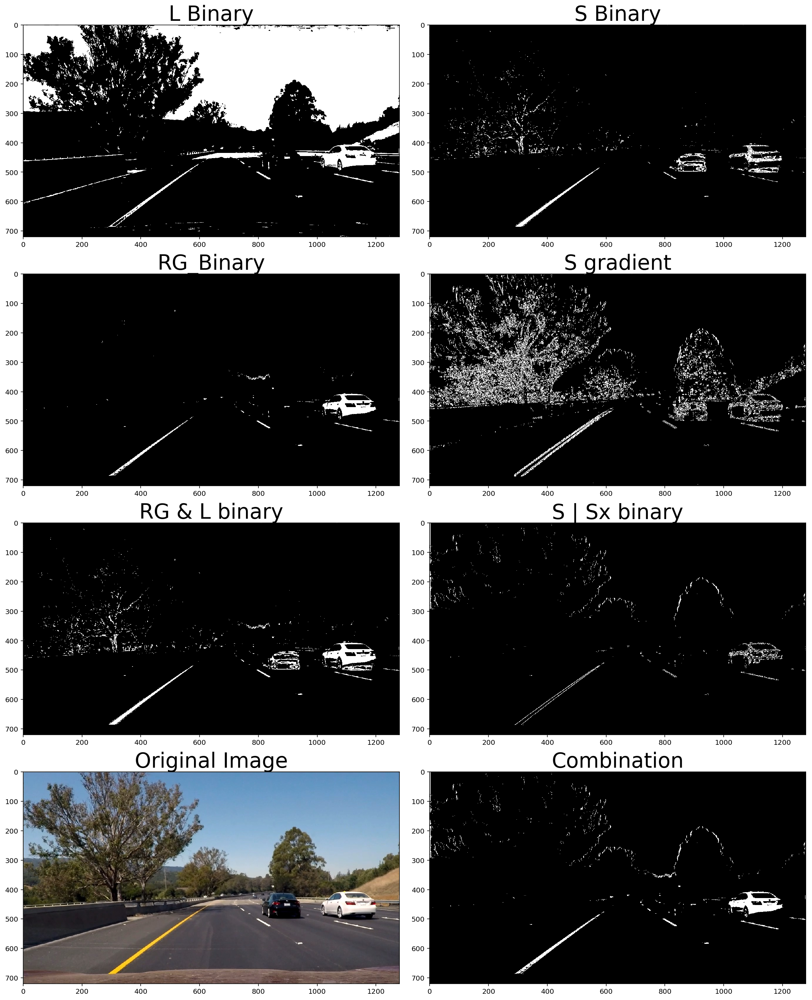

In [11]:
def color_and_gradient_threshold(image, sx_thresh=(20, 100)):
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    grad_x_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    
    #Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    l_binary, s_binary = hls_threshold(image)

    rg_binary = rgb_threshold(image)

    #rg_l_binary = rg_binary & l_binary
    rg_l_binary = rg_binary | s_binary
 
    #s_sx_binary = s_binary & sxbinary 
    #s_sx_binary = s_binary & grad_x_binary
    s_sx_binary = l_binary & sxbinary 
    
    combination = s_sx_binary | rg_binary
 
    return combination, l_binary, s_binary, sxbinary, rg_binary, rg_l_binary, s_sx_binary

# Read in an image and grayscale it
img = cv2.imread('test_images/test6.jpg')
#image = mpimg.imread('test_images/test1.jpg')

# Apply color and gradient threshold
combination, l_binary, s_binary, sx_binary, rg_binary, rg_l_binary, s_sx_binary = color_and_gradient_threshold(img)

# Plot the result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(32, 12))
f.tight_layout()

ax1.imshow(l_binary, cmap = 'gray')
ax1.set_title('L Binary', fontsize=30)

ax2.imshow(s_binary, cmap = 'gray')
ax2.set_title('S Binary', fontsize=30)

ax3.imshow(rg_binary, cmap = 'gray')
ax3.set_title('RG_Binary', fontsize=30)

ax4.imshow(sx_binary, cmap = 'gray')
ax4.set_title('S gradient', fontsize=30)

ax5.imshow(rg_l_binary, cmap = 'gray')
ax5.set_title('RG & L binary', fontsize=30)

ax6.imshow(s_sx_binary, cmap = 'gray')
ax6.set_title('S | Sx binary', fontsize=30)

ax7.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax7.set_title('Original Image', fontsize=30)

ax8.imshow(combination, cmap = 'gray')
ax8.set_title('Combination', fontsize=30)

plt.subplots_adjust(left=0., right=0.5, top=1.6, bottom=0.)

---
## Perspective Transform

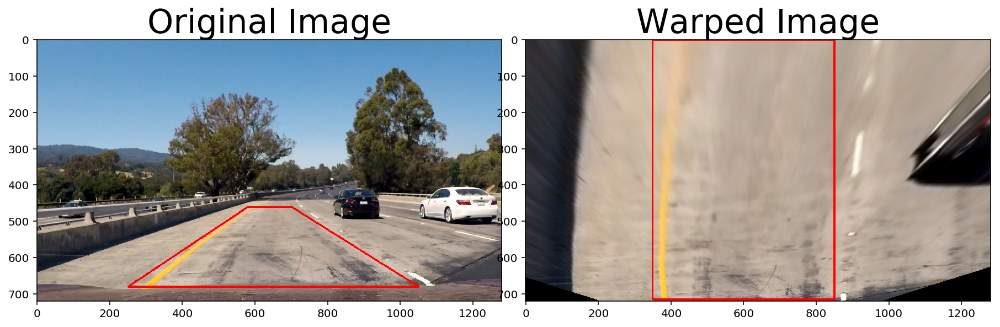

In [12]:
'''
Define function to undistort using the camera matrix and apply the perspective transform
uses the camera matrix that was calculated previously
'''
def undistort_and_warp(img, mtx, dist):

    #Undistort using mtx and dist
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Define 4 source points
    src_bottom_right = [1050,680]
    src_bottom_left = [250, 680]
    src_top_left = [580,460]
    src_top_right = [700, 460]
    src = np.float32([src_bottom_right, src_bottom_left, src_top_left, src_top_right])
    
    # Define 4 destination points
    dst_bottom_right = [850,715]
    dst_bottom_left = [350, 715]
    dst_top_left = [350,0]
    dst_top_right = [850,0]
    dst = np.float32([dst_bottom_right, dst_bottom_left, dst_top_left, dst_top_right])
    
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src,dst)
    
    # Get the inverse perspective transform
    M_inv = cv2.getPerspectiveTransform(dst,src)
    #use cv2.warpPerspective() to warp your image to a top-down view
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(undistorted_img, M, img_size, flags=cv2.INTER_LINEAR)
          
    return warped, src, dst, M_inv

# Read in a straight_line image
#image = cv2.imread('test_images/straight_lines1.jpg')
image = cv2.imread('test_images/test1.jpg')

# Read in the saved camera matrix and distortion coefficients
dist_pickle = pickle.load( open( "camera_calibration.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# undistort and warp the image by applying the camera transform (calculated previously)
undistorted_warped_image, src_pts, dst_pts, M_inv = undistort_and_warp(image, mtx, dist)
# Draw polylines on the original image with the src points
src_pts = np.array(src_pts, np.int32)
cv2.polylines(image, [src_pts], True, (0,0,255),thickness=3)
# Draw polylines on the warped image with the dst points
dst_pts = np.array(dst_pts,np.int32)
cv2.polylines(undistorted_warped_image, [dst_pts], True, (0,0,255),thickness=3)

'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(cv2.cvtColor(undistorted_warped_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Warped Image', fontsize=30)
plt.subplots_adjust(left=0., right=0.5, top=1, bottom=0.)

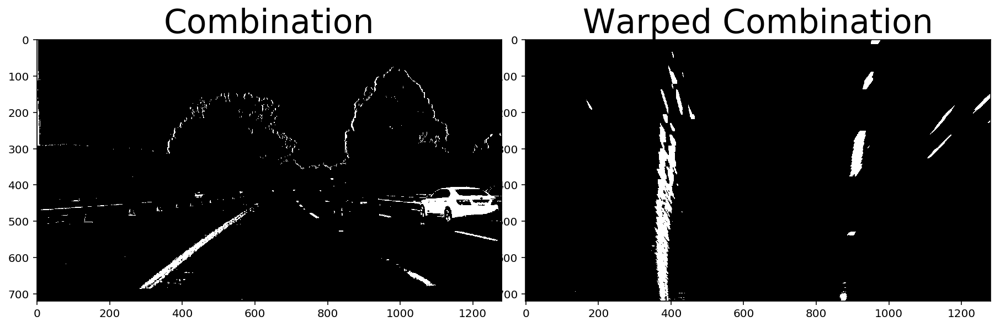

In [13]:
'''
Undistort and warp the color and gradient thresholded image
'''
# Read in a straight_line image
#image = cv2.imread('test_images/straight_lines1.jpg')
image = cv2.imread('test_images/test1.jpg')

# Read in the saved camera matrix and distortion coefficients
dist_pickle = pickle.load( open( "camera_calibration.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Compute a color and gradent combination threshold on the image
combination_threshold = color_and_gradient_threshold(image)[0]

# undistort and warp the image by applying the camera transform (calculated previously)
warped_combination, src_pts, dst_pts, M_inv = undistort_and_warp(combination_threshold, mtx, dist)

# Draw polylines on the original image with the src points
src_pts = np.array(src_pts, np.int32)
#cv2.polylines(combination_threshold, [src_pts], True, (0,0,255),thickness=3)

# Draw polylines on the warped image with the dst points
dst_pts = np.array(dst_pts,np.int32)
#cv2.polylines(warped_combination, [dst_pts], True, (0,0,255))

'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(combination_threshold, cmap = 'gray')
ax1.set_title('Combination', fontsize=30)
ax2.imshow(warped_combination, cmap = 'gray')
ax2.set_title('Warped Combination', fontsize=30)
plt.subplots_adjust(left=0., right=0.5, top=1, bottom=0.)

---
## Finding lanes in the warped image

### Use a histogram on the warped image to find left and right lane starting points

Start of left lane: 373
Start of right lane: 897


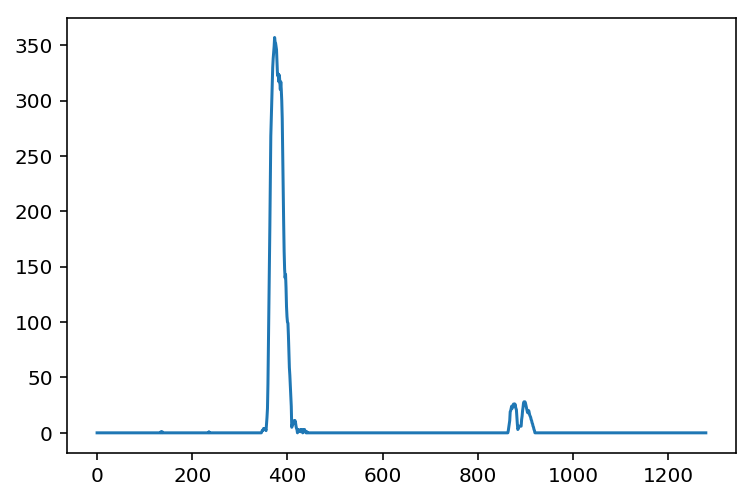

In [14]:
histogram = np.sum(warped_combination[warped_combination.shape[0]//2:,:], axis=0)
plt.plot(histogram)

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

print("Start of left lane:", leftx_base)
print("Start of right lane:", rightx_base)

### Sliding window blind search to find left and right lane lines

In [15]:
'''
Use a sliding window blind search to detect left and right lane lines in a warped image
This is used on a new warped image with no prior infor on location of left and right lane lines
'''

def sliding_window_blind_search(warped, out_img):
    '''
    Identify the starting point of the left and right lanes
    '''
    # Take a histogram of the bottom half of the image    
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Initialize Current positions (to be updated for each window) to the base values
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    '''
    Set the window parameters
    '''
    # Choose the number of sliding windows
    nwindows = 9  
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Set height of windows (= height of the entire image/number of windows)
    window_height = np.int(warped.shape[0]/nwindows)
    
    
    '''
    Sliding window search
    '''
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
                      (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
                      (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    '''
    Fit polynomials to the left nad right lane pixels
    '''        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

(720, 0)

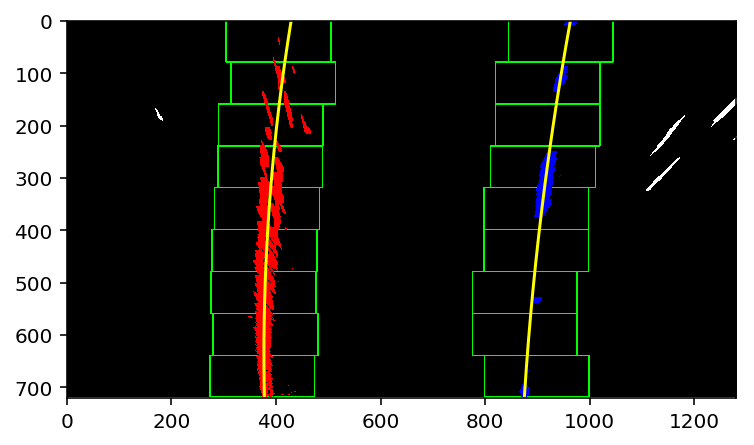

In [16]:
'''
Plot the results of a sliding window blind search on one of the test images
'''
# Create an output image to draw on and  visualize the result
out_img = np.dstack((warped_combination, warped_combination, warped_combination))*255

# Get the polynomial fits for the left and right lanes in the image using a sliding window search
left_fit, right_fit = sliding_window_blind_search(warped_combination, out_img)

# Generate x and y values for plotting
ploty = np.linspace(0, warped_combination.shape[0]-1, warped_combination.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Previous lane window search

In [17]:
'''
Locates left and right lanes using a window around previously detected lane lines
This is used to detect lanes on the next frame of a window on which lane lines have been detected
'''
def previous_lane_window_search(warped, out_img, left_fit, right_fit, margin):
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
       
    # Extract left and right lane pixels around the 
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                       left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                       left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                       right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                       right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new

(720, 0)

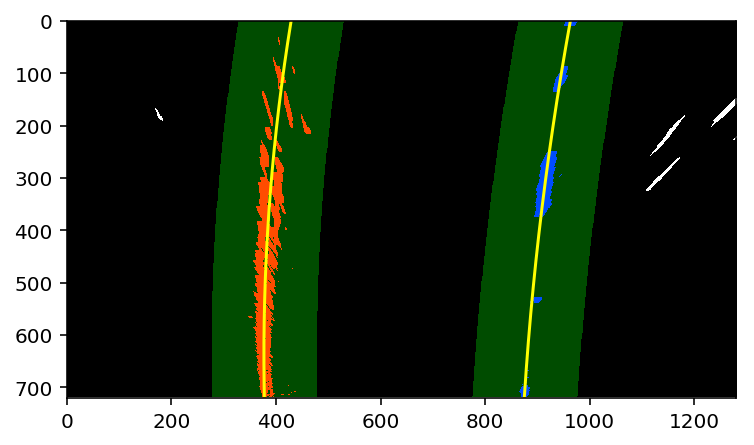

In [18]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((warped_combination, warped_combination, warped_combination))*255
out_img1 = np.dstack((warped_combination, warped_combination, warped_combination))*255
window_img = np.zeros_like(out_img)

# Define window size around the previous lanes to search over
margin = 100

# Get the polynomial fits for the left and right lanes in the image using a sliding window_blind search
left_fit, right_fit = sliding_window_blind_search(warped_combination, out_img1)

# Get the polynomial fits for the left and right lanes in the image using a sliding window search
left_fit, right_fit = previous_lane_window_search(warped_combination, out_img, left_fit, right_fit, margin)

# Generate x and y values for plotting
ploty = np.linspace(0, warped_combination.shape[0]-1, warped_combination.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Radius of curvature and offset in lane

In [19]:
def radius_and_offset(left_fit, right_fit):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to left (x,y) and right (x,y) pixel points in world space
    # Does it make more sense to test curvature on previous fits or the raw points?
    #left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    y_points = np.linspace(0, warped_combination.shape[0]-1, warped_combination.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    left_fit_cr = np.polyfit(y_points*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(y_points*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Evaluation point
    #y_eval = np.max(lefty) # bottom of the image
    y_eval = np.max(y_points) # bottom of the image

    # Calculate the left and right curvatures 
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Average curvature of the lane
    average_curverad = (left_curverad+right_curverad)/2
    
    '''
    Offset in lane
    '''
    bottom_y = image.shape[0] #image shape = [720,1280]
    left_fit_bottom = left_fit[0]*bottom_y**2 + left_fit[1]*bottom_y + left_fit[2]
    right_fit_bottom = right_fit[0]*bottom_y**2 + right_fit[1]*bottom_y + right_fit[2]

    lane_center = (left_fit_bottom + right_fit_bottom)/2.
    offset_pix = image.shape[1]/2 - lane_center # in pixels, image shape = [720,1280]
    offset_m = offset_pix*xm_per_pix
    return left_curverad, right_curverad, average_curverad, offset_m

left_rad, right_rad, average_rad, offset_m = radius_and_offset(left_fit, right_fit)
    
print("left: ", left_rad, 'm', " right: ", right_rad, 'm')
print ("average: ", average_rad)
print("Offset from lane center: %.2f m" % offset_m)

left:  1286.84463108 m  right:  2014.21243899 m
average:  1650.52853504
Offset from lane center: 0.07 m


## Lane Finding Pipeline

At this point, all the pieces are there to build a lane finding pipelines.

The functions defined to get threholded and warped images can be used as is.

Could rewrite the sliding_window_blind_search and previous_lane_window_search using a lane class to make it more efficient.

In [42]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
class ImageProcessor:
    Left = Line()
    Right = Line()
        
    def blind_search(self, warped):

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Take a histogram of the bottom half of the image    
        histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        self.Left.line_base_pos = np.argmax(histogram[:midpoint])
        self.Right.line_base_pos = np.argmax(histogram[midpoint:]) + midpoint
    
        # Initialize Current positions (to be updated for each window) to the base values
        leftx_current = self.Left.line_base_pos
        rightx_current = self.Right.line_base_pos
    
        # Choose the number of sliding windows
        nwindows = 9  
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Set height of windows (= height of the entire image/number of windows)
        window_height = np.int(warped.shape[0]/nwindows) 
    
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
    
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = warped.shape[0] - (window+1)*window_height
            win_y_high = warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                              (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                               (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
        
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
     
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    
        # Extract left and right line pixel positions
        # TODO: Should I do something different if left is detected and right is not?
        if left_lane_inds != [] and right_lane_inds != []:
            self.Left.allx = nonzerox[left_lane_inds]
            self.Left.ally = nonzeroy[left_lane_inds] 
            # Set Left lane detected to True
            self.Left.detected = True
            # Fit a second order polynomial
            self.Left.current_fit = np.polyfit(self.Left.ally, self.Left.allx, 2)
    
            self.Right.allx = nonzerox[right_lane_inds]
            self.Right.ally = nonzeroy[right_lane_inds]
            # Set Right lane detected to True
            self.Right.detected = True
            # Fit a second order polynomial
            self.Right.current_fit = np.polyfit(self.Right.ally, self.Right.allx , 2)

    '''
    Locates left and right lanes using a window around previously detected lane lines
    This is used to detect lanes on the next frame of a window on which lane lines have been detected
    '''
    def previous_search(self, warped):
    
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Define window size around the previous lanes to search over
        margin = 100
        
        left_fit = self.Left.current_fit
        right_fit = self.Right.current_fit
        # Extract left and right lane indices for a margin around the previous detected lane
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                       left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                       left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                       right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                       right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
        # TODO: Could pull this out into a common function for blind search and previous_lane search
        # Extract left and right line pixel positions
        # TODO: Should I do something different if left is detected and right is not?
        if left_lane_inds != [] and right_lane_inds != []:
            self.Left.allx = nonzerox[left_lane_inds]
            self.Left.ally = nonzeroy[left_lane_inds] 
            # Set Left lane detected to True
            self.Left.detected = True
            # Fit a second order polynomial
            self.Left.current_fit = np.polyfit(self.Left.ally, self.Left.allx, 2)
    
            self.Right.allx = nonzerox[right_lane_inds]
            self.Right.ally = nonzeroy[right_lane_inds]
            # Set Right lane detected to True
            self.Right.detected = True
            # Fit a second order polynomial
            self.Right.current_fit = np.polyfit(self.Right.ally, self.Right.allx, 2)
   
    def lane_finding_pipeline(self, img):
        # Compute a color and gradent combination threshold on the image
        thresholded = color_and_gradient_threshold(img)[0]

        # undistort and warp the image by applying the camera transform (calculated previously)
        warped, src_pts, dst_pts, M_inv = undistort_and_warp(thresholded, mtx, dist)
        
        # If we don't have a previous lane or the previous lane was not detected, do a blind search
        # Else dus to a search around a window around the previous lanes
        if (self.Left.detected == False) or (self.Right.detected == False):
            # Get the polynomial fits for the left and right lanes in the image using a sliding window search
            self.blind_search(warped)
        else:
            # Search over a window around the previously detected lanes
            self.previous_search(warped)
        
        left_fit = self.Left.current_fit
        right_fit = self.Right.current_fit
        
        # Get the radius of curvature and offset
        left_rad, right_rad, average_rad, offset_m = radius_and_offset(left_fit, right_fit)
        average_rad_string = "Radius of Curvature: %.2f m" % average_rad
        offset_string = "Center Offset: %.2f m" % offset_m
    
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        
        # Get the left and right points from the fit
        y_points = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, y_points]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y_points])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, M_inv, (image.shape[1], image.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
        cv2.putText(result,average_rad_string , (110, 110), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness=2)
        cv2.putText(result, offset_string, (110, 170), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness=2)
        return result

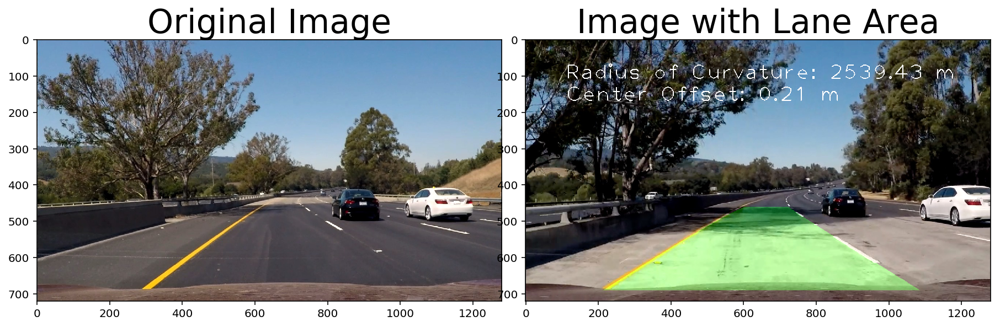

In [48]:
testImage = ImageProcessor()
image = cv2.imread('test_images/test5.jpg')
result = testImage.lane_finding_pipeline(image)

'''
Plot the result
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
ax2.set_title('Image with Lane Area', fontsize=30)
plt.subplots_adjust(left=0., right=0.5, top=1, bottom=0.)

In [49]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [50]:
project_video_output = 'video_output/project_video_out.mp4'
project_video_processor = ImageProcessor()

clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(project_video_processor.lane_finding_pipeline) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video video_output/project_video_out.mp4
[MoviePy] Writing video video_output/project_video_out.mp4



100%|█████████▉| 1260/1261 [02:49<00:00,  7.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output/project_video_out.mp4 

CPU times: user 19min 31s, sys: 7.89 s, total: 19min 39s
Wall time: 2min 50s
